<a href="https://colab.research.google.com/github/curiosity806/2020_dacon_satellite_precipitation/blob/deagwon/Dacon_satellite_normalization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import glob
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
from tqdm import tqdm
import matplotlib.pyplot as plt
import tensorflow as tf
import os
import random
from tensorflow.keras.layers import Dense, Conv2D, Dropout, Conv2DTranspose, MaxPooling2D, BatchNormalization, Activation, concatenate, Input, GlobalAveragePooling2D
from tensorflow.keras import Model
import warnings
import gc
import matplotlib.pyplot as plt
import matplotlib.animation as animation
 
warnings.filterwarnings("ignore")

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
!apt install proj-bin libproj-dev libgeos-dev
!pip install https://github.com/matplotlib/basemap/archive/v1.1.0.tar.gz
!pip install https://github.com/matplotlib/basemap/archive/master.zip
from mpl_toolkits.basemap import Basemap

Reading package lists... Done
Building dependency tree       
Reading state information... Done
Suggested packages:
  libgdal-doc
The following NEW packages will be installed:
  libgeos-dev libproj-dev proj-bin
0 upgraded, 3 newly installed, 0 to remove and 29 not upgraded.
Need to get 305 kB of archives.
After this operation, 1,706 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libgeos-dev amd64 3.6.2-1build2 [73.1 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libproj-dev amd64 4.9.3-2 [199 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 proj-bin amd64 4.9.3-2 [32.3 kB]
Fetched 305 kB in 0s (2,997 kB/s)
Selecting previously unselected package libgeos-dev.
(Reading database ... 144429 files and directories currently installed.)
Preparing to unpack .../libgeos-dev_3.6.2-1build2_amd64.deb ...
Unpacking libgeos-dev (3.6.2-1build2) ...
Selecting previously unselected package libproj-dev:amd64.
Prepa

     - 189.2MB 497kB/s
  Created wheel for basemap: filename=basemap-1.2.1-cp36-cp36m-linux_x86_64.whl size=121756014 sha256=6a3c72528d58ecb36df463e074731cf3b3cdf6ec4ea22bb20cf6b72492f83a12
  Stored in directory: /tmp/pip-ephem-wheel-cache-bv7top0h/wheels/98/4a/fc/ce719b75d97e646645c225f3332b1b217536100314922e9572
Successfully built basemap
  Found existing installation: basemap 1.1.0
    Uninstalling basemap-1.1.0:
      Successfully uninstalled basemap-1.1.0


In [0]:
# style 설정
plt.style.use('dark_background')
plt.style.use('seaborn-colorblind')

In [0]:
tf.__version__

'2.2.0-rc4'

## 데이터 받아오기

In [0]:
# 재생산성을 위해 시드 고정
np.random.seed(7)
random.seed(7)
tf.random.set_seed(7)

In [0]:
# 훈련 데이터 및 자가 test데이터 불러오기
train = np.load('/content/drive/My Drive/2020 Kaggle Study/data/orbit_no_shuffle/train_add.npy')
train_orbit = np.load('/content/drive/My Drive/2020 Kaggle Study/data/orbit_no_shuffle/train_orbit.npy')

#test = np.load('/content/drive/My Drive/2020 Kaggle Study/data/32bits_data/test_32bits.npy')

In [0]:
# DEM 파일 받아오기
train_dem = np.load('/content/drive/My Drive/2020 Kaggle Study/DEM_DPR/dem_train_DPR.npy')

In [0]:
type(train_dem[0,0,0,0])

numpy.float64

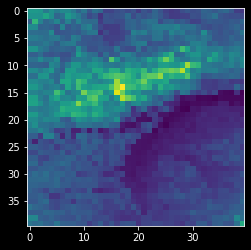

In [0]:
plt.imshow(train_dem[103,:,:,0])
#train_dem[0].shape

In [0]:
#데이터 Random Shuffle
'''## EDA를 위해서 셔플 진행 X

index = np.arange(train.shape[0])
np.random.shuffle(index)

#train set shuffle

train = train[index,:,:,:]
gc.collect()
train.shape

#test set shuffle

train_orbit = train_orbit[index,:]
gc.collect()
train_orbit.shape

'''

'## EDA를 위해서 셔플 진행 X\n\nindex = np.arange(train.shape[0])\nnp.random.shuffle(index)\n\n#train set shuffle\n\ntrain = train[index,:,:,:]\ngc.collect()\ntrain.shape\n\n#test set shuffle\n\ntrain_orbit = train_orbit[index,:]\ngc.collect()\ntrain_orbit.shape\n\n'

In [0]:
# train_orbit을 이용하여 연도, 월, 날짜 시간 데이터 생성
# DataFrame으로 변환
train_orbit = pd.DataFrame(train_orbit)
train_orbit.columns = ['orbit_number', 'order']
# orbit_number :  위성이 사용되기 시작한 이후로 몇 번째 지구를 돌았는지 나타내는 수(orbit 번호)
# order : 해당 orbit에서 몇 번째 subset인지를 나타내는 수입니다. orbit별로 subset의 개수는 다를 수 있음 (subset 번호)
train_orbit.head()

,orbit_number,order
0,10462,1
1,10462,2
2,10462,3
3,10462,4
4,10462,5


train.zip
-     2016~2018 년 관측된 자료 (76,345개)
-     2016년 자료: orbit 번호 010462 ~ 016152 (25,653개)
-     2017년 자료: orbit 번호 016154 ~ 021828 (25,197개)
-     2018년 자료: orbit 번호 021835 ~ 027509 (25,495개)

test.zip 
-     2019년 관측된 자료 (2,416개)

# Orbit에서 시간 추출하기

### train_orbit 전처리

In [0]:
# year column 추가
train_orbit['year'] = 0
train_orbit.loc[train_orbit.orbit_number <= 16152,'year'] = 2016
train_orbit.loc[(16152 <= train_orbit.orbit_number) & (train_orbit.orbit_number <= 21828), 'year'] = 2017
train_orbit.loc[(21828 < train_orbit.orbit_number) & (train_orbit.orbit_number <= 27509), 'year'] = 2018

In [0]:
train_orbit.year.value_counts()

2016    25650
2018    25495
2017    25200
Name: year, dtype: int64

In [0]:
# month column 추가
train_orbit['month'] = 0
train_orbit.loc[train_orbit.loc[:,'year'] == 2016,'month'] = ((train_orbit.loc[train_orbit.loc[:,'year'] == 2016,'orbit_number'] - 10462)/(16152 - 10462) * 12)
train_orbit.loc[train_orbit.loc[:,'year'] == 2017,'month'] = ((train_orbit.loc[train_orbit.loc[:,'year'] == 2017,'orbit_number'] - 16152)/(21828 - 16152) * 12)
train_orbit.loc[train_orbit.loc[:,'year'] == 2018,'month'] = ((train_orbit.loc[train_orbit.loc[:,'year'] == 2018,'orbit_number'] - 21828)/(27509 - 21828) * 12)

train_orbit.month = train_orbit.month.apply(np.ceil)# 올림
train_orbit.month[train_orbit.month == 0] = 1 # 가장 처음 나오는 orbit은 1월로

In [0]:
#day column 추가
train_orbit['day'] = 0
train_orbit.loc[train_orbit.loc[:,'year'] == 2016,'day'] = ((train_orbit.loc[train_orbit.loc[:,'year'] == 2016,'orbit_number'] - 10462)/(16152 - 10462) * 366) #2016년은 366일
train_orbit.loc[train_orbit.loc[:,'year'] == 2017,'day'] = ((train_orbit.loc[train_orbit.loc[:,'year'] == 2017,'orbit_number'] - 16152)/(21828 - 16152) * 365)
train_orbit.loc[train_orbit.loc[:,'year'] == 2018,'day'] = ((train_orbit.loc[train_orbit.loc[:,'year'] == 2018,'orbit_number'] - 21828)/(27509 - 21828) * 365)

train_orbit.day = train_orbit.day.apply(np.ceil)# 올림
train_orbit.day[train_orbit.day == 0] = 1 # 가장 처음 나오는 orbit은 1일로

In [0]:
#time column 추가
train_orbit['time'] = 0
train_orbit.loc[train_orbit.loc[:,'year'] == 2016,'time'] = (train_orbit.loc[train_orbit.loc[:,'year'] == 2016,'orbit_number'] - 10462)/(16152 - 10462)*(366 * 24) % 24 #2016년은 366일
train_orbit.loc[train_orbit.loc[:,'year'] == 2017,'time'] = (train_orbit.loc[train_orbit.loc[:,'year'] == 2017,'orbit_number'] - 16152)/(21828 - 16152)*(365 * 24) % 24
train_orbit.loc[train_orbit.loc[:,'year'] == 2018,'time'] = (train_orbit.loc[train_orbit.loc[:,'year'] == 2018,'orbit_number'] - 21828)/(27509 - 21828)*(365 * 24) % 24

train_orbit.time = train_orbit.time.apply(np.floor)# 내림

In [0]:
## month, day, time 은 각각 주기성을 갖기 때문에 이를 고려할 수 있도록 인코딩
# 출처 :https://www.kaggle.com/avanwyk/encoding-cyclical-features-for-deep-learning

#1. month_sin, month_cos만들기
train_orbit['month_sin'] = np.sin(2 * np.pi * (train_orbit['month']-1)/11)
train_orbit['month_cos'] = np.cos(2 * np.pi * (train_orbit['month']-1)/11)

# 2. day
train_orbit['day_sin'] = np.sin(2 * np.pi * (train_orbit['day']-1)/365)
train_orbit['day_cos'] = np.cos(2 * np.pi * (train_orbit['day']-1)/365)

# 3. time
train_orbit['time_sin'] = np.sin(2 * np.pi * (train_orbit['time'])/23)
train_orbit['time_cos'] = np.cos(2 * np.pi * (train_orbit['time'])/23)



(-1.0, 1.0)

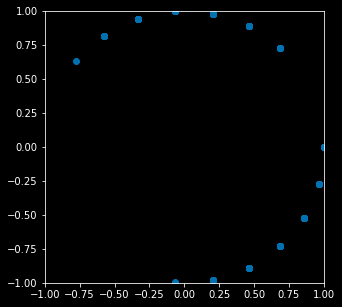

In [0]:
plt.figure(figsize = (5,5))
plt.scatter(train_orbit.loc[(train_orbit['day'] <= 2) & (train_orbit['year'] == 2017), 'time_cos'],
            train_orbit.loc[(train_orbit['day'] <= 2) & (train_orbit['year'] == 2017), 'time_sin'])
plt.xlim(-1,1)
plt.ylim(-1,1)

In [0]:
train_orbit.to_csv('/content/drive/My Drive/2020 Kaggle Study/data/orbit_no_shuffle/train_orbit.csv')

In [0]:
train_orbit[1010:].head(10)


,orbit_number,order,year,month,day,time,month_sin,month_cos,day_sin,day_cos,time_sin,time_cos
1010,10680,7,2016,1.0,15.0,0.0,0.0,1.0,0.238673,0.9711,0.000000,1.000000
1011,10683,1,2016,1.0,15.0,5.0,0.0,1.0,0.238673,0.9711,0.979084,0.203456
1012,10683,2,2016,1.0,15.0,5.0,0.0,1.0,0.238673,0.9711,0.979084,0.203456
1013,10683,3,2016,1.0,15.0,5.0,0.0,1.0,0.238673,0.9711,0.979084,0.203456
1014,10683,4,2016,1.0,15.0,5.0,0.0,1.0,0.238673,0.9711,0.979084,0.203456
1015,10684,1,2016,1.0,15.0,6.0,0.0,1.0,0.238673,0.9711,0.997669,-0.068242
1016,10684,2,2016,1.0,15.0,6.0,0.0,1.0,0.238673,0.9711,0.997669,-0.068242
1017,10684,3,2016,1.0,15.0,6.0,0.0,1.0,0.238673,0.9711,0.997669,-0.068242
1018,10684,4,2016,1.0,15.0,6.0,0.0,1.0,0.238673,0.9711,0.997669,-0.068242
1019,10684,5,2016,1.0,15.0,6.0,0.0,1.0,0.238673,0.9711,0.997669,-0.068242


### test_orbit 전처리

In [0]:
np.mean([16152 - 10462, 21828 - 16152, 27509 - 21828])

5682.333333333333

In [0]:
#test data도 시간 데이터 추가하기
test_orbit = np.load('/content/drive/My Drive/2020 Kaggle Study/data/orbit_no_shuffle/test_orbit.npy')
test_orbit = pd.DataFrame(test_orbit)
test_orbit.columns = ['orbit_number', 'order']
test_orbit['year'] = 2019
test_orbit['month'] = (test_orbit['orbit_number'] - 27510) / 5682 * 12
test_orbit['day'] = (test_orbit['orbit_number'] - 27510)/5682 * 365
test_orbit['time'] = (test_orbit['orbit_number'] - 27510)/(5682)*(365 * 24) % 24



test_orbit.month = test_orbit.month.apply(np.ceil)# 올림
test_orbit.month[test_orbit.month == 0] = 1 # 가장 처음 나오는 orbit은 1월로
test_orbit.day = test_orbit.day.apply(np.ceil)# 올림
test_orbit.day[test_orbit.day == 0] = 1 # 가장 처음 나오는 orbit은 1일로
train_orbit.time = train_orbit.time.apply(np.floor)# 내림

#1. month_sin, month_cos만들기
test_orbit['month_sin'] = np.sin(2 * np.pi * (test_orbit['month']-1)/11)
test_orbit['month_cos'] = np.cos(2 * np.pi * (test_orbit['month']-1)/11)

# 2. day
test_orbit['day_sin'] = np.sin(2 * np.pi * (test_orbit['day']-1)/365)
test_orbit['day_cos'] = np.cos(2 * np.pi * (test_orbit['day']-1)/365)

# 3. time
test_orbit['time_sin'] = np.sin(2 * np.pi * (test_orbit['time'])/23)
test_orbit['time_cos'] = np.cos(2 * np.pi * (test_orbit['time'])/23)

#test_orbit.to_csv('/content/drive/My Drive/2020 Kaggle Study/data/orbit_no_shuffle/test_orbit.csv')

### 40,40,2사이즈로 days와 times 만들기


In [0]:
train_time = pd.read_csv('/content/drive/My Drive/2020 Kaggle Study/data/orbit_no_shuffle/train_time.csv')
test_time = pd.read_csv('/content/drive/My Drive/2020 Kaggle Study/data/orbit_no_shuffle/test_time.csv')

train_days = np.zeros([train_time.shape[0],40,40,2], np.float16)
train_times = np.zeros([train_time.shape[0],40,40,2], np.float16)

for i in range(len(train_time)):
    train_days[i,:,:,0] = train_time.day_sin.values[i]
    train_days[i,:,:,1] = train_time.day_cos.values[i]
    train_times[i,:,:,0] = train_time.time_sin.values[i]
    train_times[i,:,:,1] = train_time.time_cos.values[i]

test_days = np.zeros([test_time.shape[0],40,40,2], np.float16)
test_times = np.zeros([test_time.shape[0],40,40,2], np.float16)

for i in range(len(test_time)):
    test_days[i,:,:,0] = test_time.day_sin.values[i]
    test_days[i,:,:,1] = test_time.day_cos.values[i]
    test_times[i,:,:,0] = test_time.time_sin.values[i]
    test_times[i,:,:,1] = test_time.time_cos.values[i]


np.save('/content/drive/My Drive/2020 Kaggle Study/data/orbit_no_shuffle/train_days.npy', train_days)
np.save('/content/drive/My Drive/2020 Kaggle Study/data/orbit_no_shuffle/train_times.npy', train_times)

np.save( '/content/drive/My Drive/2020 Kaggle Study/data/orbit_no_shuffle/test_days.npy',test_days)
np.save('/content/drive/My Drive/2020 Kaggle Study/data/orbit_no_shuffle/test_times.npy',test_times)


# 시간 별 EDA

## 시간 vs CH

### Month vs CH

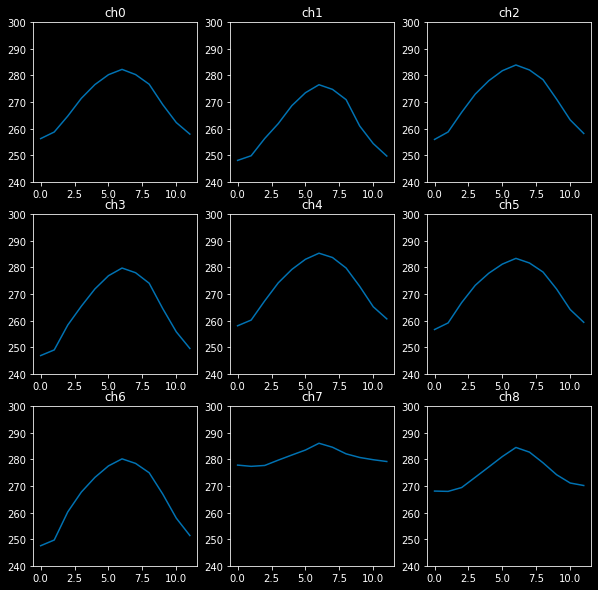

In [0]:
plt.figure(figsize = (10,10))
for ch in range(9):
    plt.subplot(3,3,ch+1)
    per90 = []
    for i in range(12):
        time_index = train_orbit.month == i + 1
        per90.append(np.percentile(train[time_index,:,:,ch].reshape(-1), 90))
    plt.plot(per90)
    plt.title(f'ch{ch}')
    plt.ylim(240,300)

### Day vs CH

In [0]:
np.argmax(per90)

203

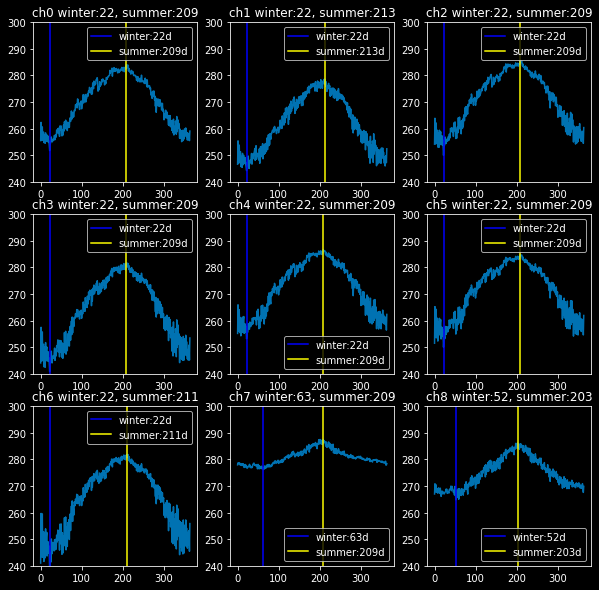

avg_winter: 29.88888888888889
agv_summer: 209.0


In [0]:
plt.figure(figsize = (10,10))
winter = []
summer = []
for ch in range(9):
    plt.subplot(3,3,ch+1)
    per90 = []
    for i in range(365):
        time_index = train_orbit.day == i + 1
        per90.append(np.percentile(train[time_index,:,:,ch].reshape(-1), 90))
    plt.plot(per90)
    
    summer.append(np.argmax(per90))
    winter.append(np.argmin(per90))

    plt.title(f'ch{ch} winter:{winter[-1]}, summer:{summer[-1]}')

    plt.axvline(winter[-1], label = f'winter:{winter[-1]:d}d', c = 'blue')
    plt.axvline(summer[-1], label = f'summer:{summer[-1]:d}d', c = 'yellow')
    plt.legend()
    plt.ylim(240,300)
plt.show()
print('avg_winter:', np.mean(winter))
print('agv_summer:', np.mean(summer))

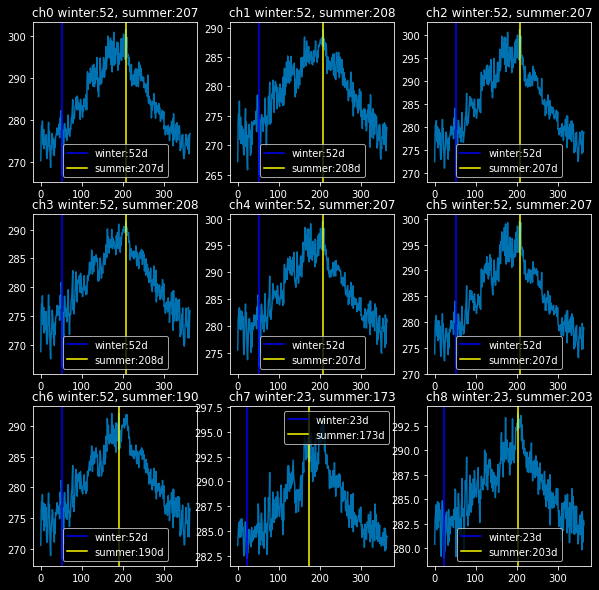

avg_winter: 45.55555555555556
agv_summer: 201.11111111111111


In [0]:
plt.figure(figsize = (10,10))
winter = []
summer = []
for ch in range(9):
    plt.subplot(3,3,ch+1)
    per90 = []
    for i in range(365):
        time_index = train_orbit.day == i + 1
        per90.append(np.percentile(train[time_index,:,:,ch].reshape(-1), 99))
    plt.plot(per90)
    
    summer.append(np.argmax(per90))
    winter.append(np.argmin(per90))

    plt.title(f'ch{ch} winter:{winter[-1]}, summer:{summer[-1]}')

    plt.axvline(winter[-1], label = f'winter:{winter[-1]:d}d', c = 'blue')
    plt.axvline(summer[-1], label = f'summer:{summer[-1]:d}d', c = 'yellow')
    plt.legend()
    #plt.ylim(240,300)
plt.show()
print('avg_winter:', np.mean(winter))
print('agv_summer:', np.mean(summer))

### Time vs CH

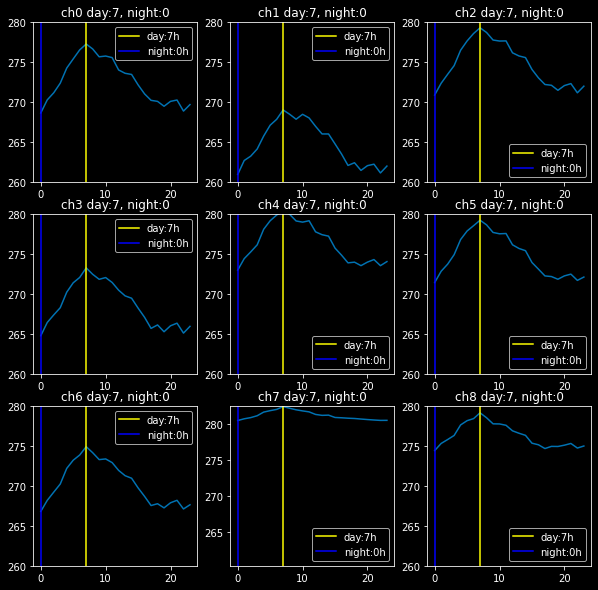

avg_day: 7.0
agv_night: 0.0


In [0]:
# 시간(24시간)
plt.figure(figsize = (10,10))
day = []
night = []
for ch in range(9):
    plt.subplot(3,3,ch+1)
    per90 = []
    for i in range(24):
        time_index = train_orbit.time == i 
        per90.append(np.percentile(train[time_index,:,:,ch].reshape(-1), 90))
    plt.plot(per90)
    day.append(np.argmax(per90))
    night.append(np.argmin(per90))
    plt.title(f'ch{ch} day:{day[-1]}, night:{night[-1]}')
    plt.axvline(day[-1], label = f'day:{day[-1]:d}h', c = 'yellow')
    plt.axvline(night[-1], label = f'night:{night[-1]:d}h', c = 'blue')
    plt.legend()

    if ch == 7:
        plt.ylim(260.290)
    else:
        plt.ylim(260,280)

plt.show()
print('avg_day:', np.mean(day))
print('agv_night:', np.mean(night))


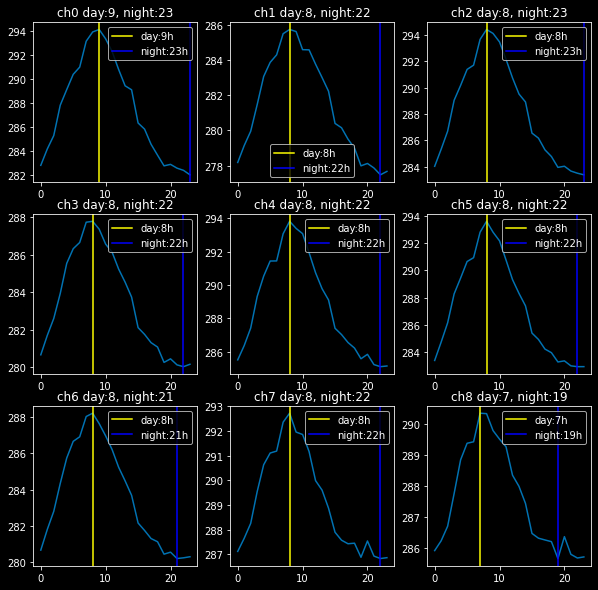

avg_day: 8.0
agv_night: 21.77777777777778


In [0]:
# 시간(24시간)
plt.figure(figsize = (10,10))
day = []
night = []
for ch in range(9):
    plt.subplot(3,3,ch+1)
    per90 = []
    for i in range(24):
        time_index = train_orbit.time == i 
        per90.append(np.percentile(train[time_index,:,:,ch].reshape(-1), 99))
    plt.plot(per90)
    day.append(np.argmax(per90))
    night.append(np.argmin(per90))
    plt.title(f'ch{ch} day:{day[-1]}, night:{night[-1]}')
    plt.axvline(day[-1], label = f'day:{day[-1]:d}h', c = 'yellow')
    plt.axvline(night[-1], label = f'night:{night[-1]:d}h', c = 'blue')
    plt.legend()

    #if ch == 7:
    #    plt.ylim(260.290)
    #else:
    #    plt.ylim(260,280)

plt.show()
print('avg_day:', np.mean(day))
print('agv_night:', np.mean(night))


## 시간 vs 강수량

### day vs 강수량

Text(0.5, 1.0, 'precipitation')

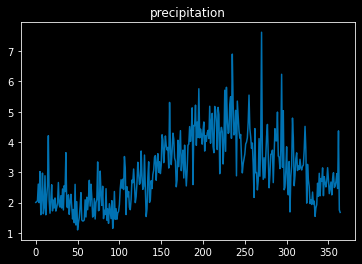

In [0]:
ch = -1
per90 = []
for i in range(365):
    time_index = train_orbit.day == i + 1
    per90.append(np.percentile(train[time_index,:,:,ch].reshape(-1), 99))
plt.plot(per90)
plt.title(f'precipitation')


### Time vs 강수량

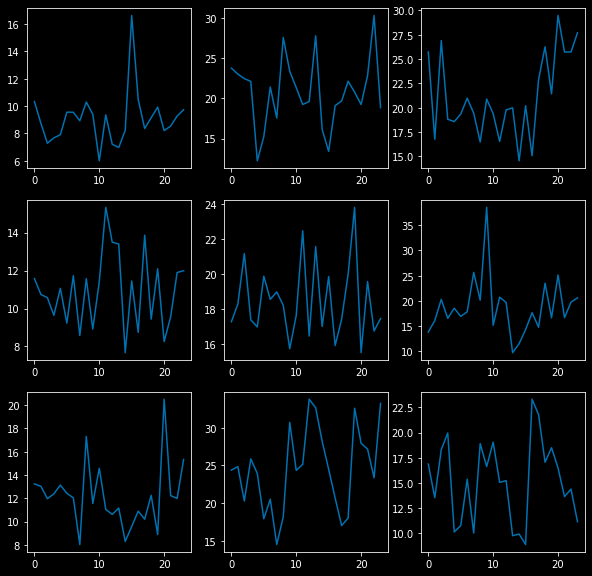

In [0]:
#전체 train data를 9개의 구역으로 자르고 구역별로
#시간 vs 강수량 그래프를 그려서
#동일한 패턴이 반복되는지를 확인한다.

########==> 눈에 띄는 패턴이 존재하지 않는다.


# 시간(24시간)
ch = 14 #강수량
plt.figure(figsize = (10,10))

unit = int(len(train) / 9)

for n in range(9):
    plt.subplot(3,3,n+1)
    per90 = []
    for i in range(24):
        time_index = train_orbit.time == i

        # band * n 부터 band * (n+1) 까지 구간만 인덱싱
        time_index[:n*unit] = False
        time_index[(n+1)*unit:] = False
        
        per90.append(np.percentile(train[time_index,:,:,ch].reshape(-1), 99.9))
    plt.plot(per90)

## Normalization을 위한 EDA

In [0]:
# 16(위도 경도 16칸)* 2(육지 바다) * 4(여름 겨울 낮 밤) 

In [0]:
# 1.위도 경도 기준 16칸 나누기 
# 2. 육지 바다 로 나누기 총 32칸
# 3. 여름 겨울 낮 밤 다시 4칸 나누기

# 총 128구역의 default를 찾는 regression 

In [0]:
#경도의 최대 최소
long_max = np.max(train[:,:,:,10].reshape(-1))
long_min = np.min(train[:,:,:,10].reshape(-1))

print(long_max)
print(long_min)

176.28397
103.60927


In [0]:
#위도의 최대 최소
lat_max = np.max(train[:,:,:,11].reshape(-1))
lat_min = np.min(train[:,:,:,11].reshape(-1))

print(lat_max)
print(lat_min)

55.846363
4.0785685


In [0]:
# 채널별로 나누기 9개: 0,1,2,3,4,5,6,7,8,9

# 1.
# land_type이 0-> 바다 : 0
# land_type > 0 -> 육지 : 1

# 2.
# (현재long - lon_min) * 4 // (long_max - long_min) = > 구역의 column index 경도 구역 : 0,1,2,3
# (현재lat - lat_min) * 4 // (lat_max - lat_min) = > 구역의 row index 위도 구역 : 0,1,2,3

# 3. 
# (day가 > 45 & day < 201) -> 여름: 0,1
# (day < 45 & day > 201) - > 겨울: 0,1

# 4. 
# (time > 8 & time < 21) -> 낮 : 0,1
# (time < 8 & time > 21) - > 밤0: 0,1

In [0]:
# 16개 구역 만들기
train.shape[0] * 40 * 40

122152000

In [0]:
122152000 / 16

7634500.0

In [0]:
index = [[[],[],[],[],[]],
         [[],[],[],[],[]],
         [[],[],[],[],[]],
         [[],[],[],[],[]]]

In [0]:
index = [[[],[],[],[],[]],
         [[],[],[],[],[]],
         [[],[],[],[],[]],
         [[],[],[],[],[]]]

In [0]:
# index[경도][위도]
index[0][3].append(2)
index

[[[1, 2], [], [], [2], []],
 [[], [], [], [], []],
 [[], [], [], [], []],
 [[], [], [], [], []]]

In [0]:
train.shape

(76345, 40, 40, 15)

In [0]:
length = len(train[:,:,:,0].reshape(-1))
length

122152000

In [0]:
index = [[[1],[2],[3],[4]],
         [[5],[6],[7],[8]],
         [[9],[11],[12],[13]],
         [[14],[15],[16],[17]]]
index

[[[1], [2], [3], [4]],
 [[5], [6], [7], [8]],
 [[9], [11], [12], [13]],
 [[14], [15], [16], [17]]]

In [0]:
index[1][2]

[7]

In [0]:
# 4*4구역 * 육지 or 바다 정보 - > 16 칸

index = [[[[],[]],[[],[]],[[],[]],[[],[]]],
         [[[],[]],[[],[]],[[],[]],[[],[]]],
         [[[],[]],[[],[]],[[],[]],[[],[]]],
         [[[],[]],[[],[]],[[],[]],[[],[]]]]

In [0]:
index[0][0]

[[], [1]]

In [0]:
# (현재long - lon_min) * 4 // (long_max - mong_min) = > 구역의 column index
index = [[[],[],[],[]],
         [[],[],[],[]],
         [[],[],[],[]],
         [[],[],[],[]]]
for i in tqdm(range(length)):
    index[int((train[:,:,:,10].reshape(-1)[i]-long_min)*4/(long_max-long_min))][int((train[:,:,:,11].reshape(-1)[i]-lat_min)*4/(lat_max-lat_min))].append(train[:,:,:,0].reshape(-1)[i])
    

  3%|▎         | 3288108/122152000 [00:37<22:38, 87493.62it/s]

KeyboardInterrupt: ignored

In [0]:
index[1][2].append(1)

In [0]:
a = np.array(index)

In [0]:
a.shape

(4, 4)

In [0]:
(train[:,:,:,10].reshape(-1)[0]-long_min)*4//(long_max-long_min)

3.0

In [0]:
76345 / 128

596.4453125

# 픽셀 단위로 EDA
Pandas 를 사용할 경우 메모리 초과  
numpy로 진행

특히 scatterplot을 그릴 때 메모리 소비가 증가하므로, 하나씩 그리기  
그래도 안되서 데이터 타입을 np.float16으로 변경

In [0]:
train_numeric = np.zeros((train.shape[0] * 40 * 40 ,5), np.float16)

train_numeric[:,0] = train[:,:,:,9].reshape(-1) # land type
train_numeric[:,1] = train[:,:,:,10].reshape(-1) # GMI longitude
train_numeric[:,2] = train[:,:,:,11].reshape(-1) # GMI latitude
train_numeric[:,3] = train[:,:,:,14].reshape(-1) #  precipication
train_numeric[train_numeric[:,3]<0,3]= 0## Null값은 모두 0으로 초기화

for i,month in enumerate(train_orbit.month.values):
    train_numeric[i*1600 : (i+1)*1600,4]  = month # Month

gc.collect()

2424

* Precipitation vs GMI_latitude

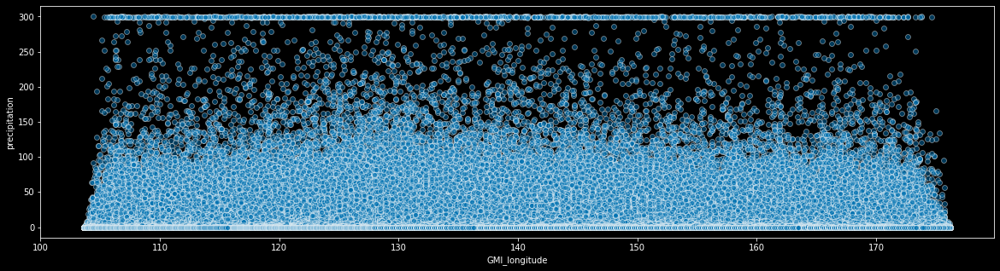

2515

In [0]:
plt.figure(figsize = (20,5))
sns.scatterplot(train_numeric[:,1],train_numeric[:,3], alpha = 0.5)
plt.ylabel('precipitation')
plt.xlabel('GMI_longitude')
plt.show()
gc.collect()

* Precipitation vs GMI_longitude

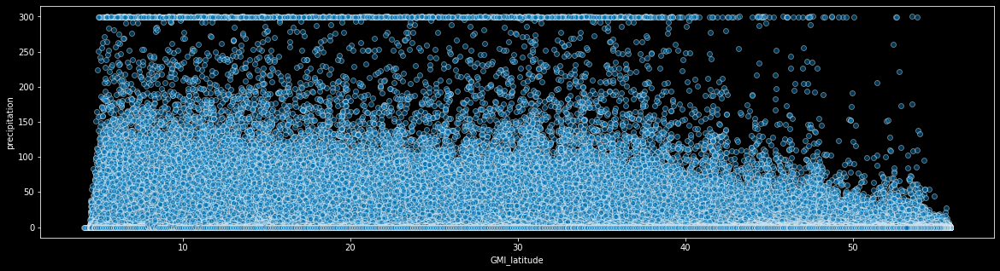

2341

In [0]:
plt.figure(figsize = (20,5))
sns.scatterplot(train_numeric[:,2],train_numeric[:,3], alpha = 0.5)
plt.ylabel('precipitation')
plt.xlabel('GMI_latitude')
plt.show()
gc.collect()

* Precipitation vs Land type

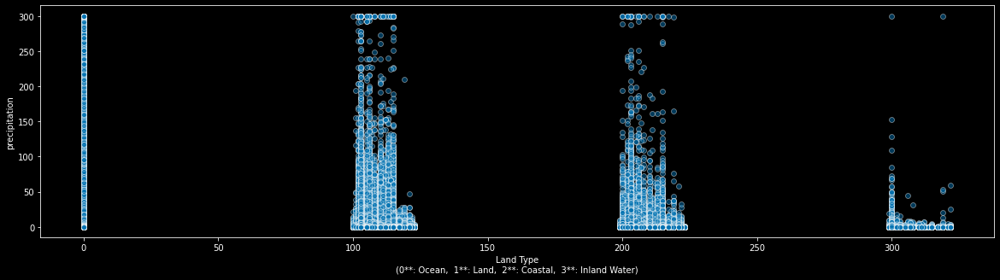

2457

In [0]:
plt.figure(figsize = (20,5))
sns.scatterplot(train_numeric[:,0],train_numeric[:,3], alpha = 0.5)
plt.ylabel('precipitation')
plt.xlabel('Land Type\n(0**: Ocean,  1**: Land,  2**: Coastal,  3**: Inland Water)')
plt.show()
gc.collect()

## Feature별 histogram 그리기

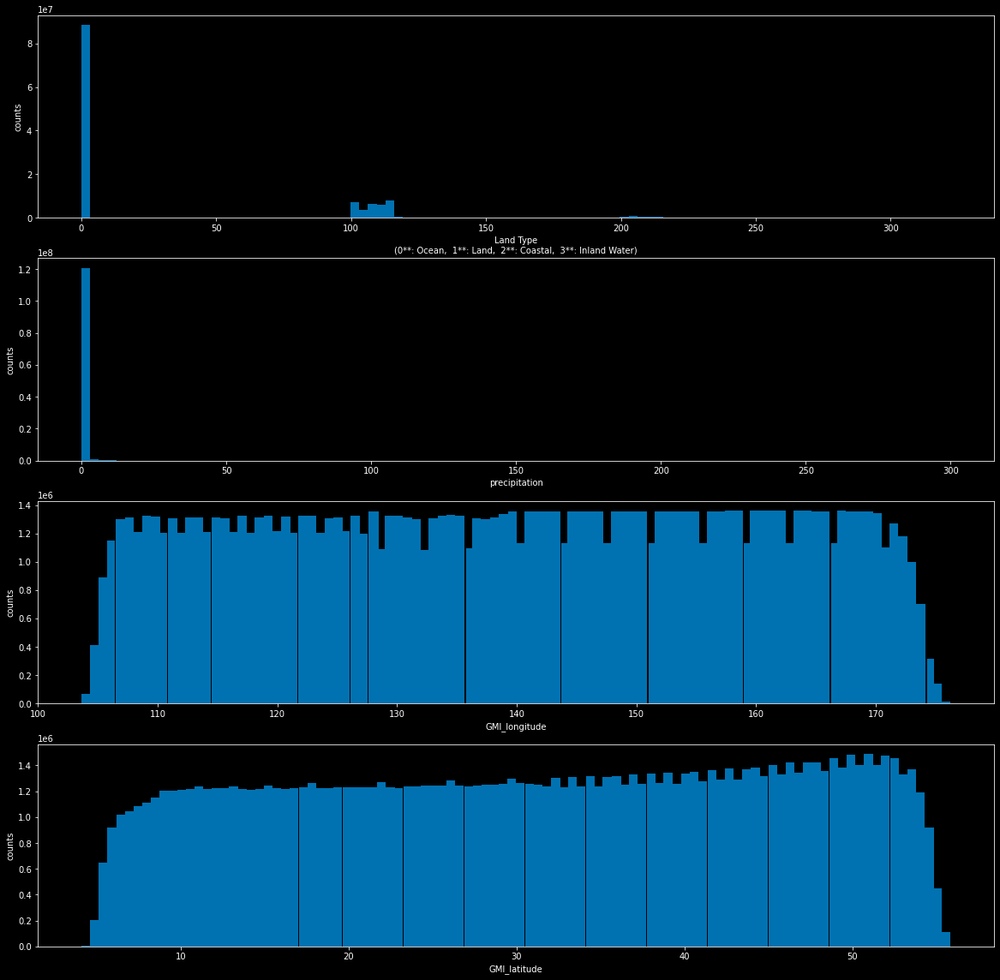

36114

In [0]:
plt.figure(figsize = (20,20))

plt.subplot(4,1,1)
plt.hist(train_numeric[:,0], bins = 100)
#plt.ylim(0,2.0e7)
plt.ylabel('counts')
plt.xlabel('Land Type\n(0**: Ocean,  1**: Land,  2**: Coastal,  3**: Inland Water)')

plt.subplot(4,1,2)
plt.hist(train_numeric[:,3], bins = 100)
#plt.ylim(0,0.1e8)
plt.ylabel('counts')
plt.xlabel('precipitation')

plt.subplot(4,1,3)
plt.hist(train_numeric[:,1], bins = 100)
plt.ylabel('counts')
plt.xlabel('GMI_longitude')

plt.subplot(4,1,4)
plt.hist(train_numeric[:,2], bins = 100)
plt.ylabel('counts')
plt.xlabel('GMI_latitude')

plt.show()
gc.collect()

* Feature별 histogram 그리기 ylim 조정

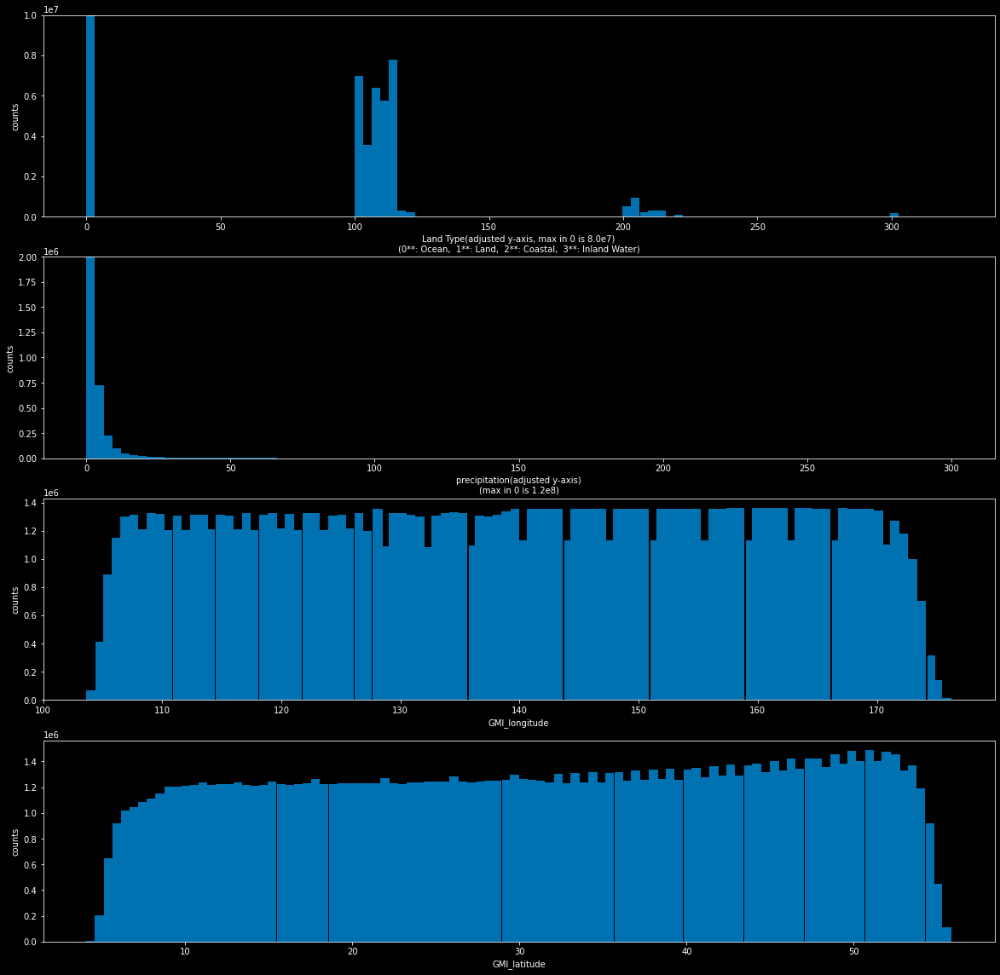

36203

In [0]:
plt.figure(figsize = (20,20))

plt.subplot(4,1,1)
plt.hist(train_numeric[:,0], bins = 100)
plt.ylim(0,1.0e7)
plt.ylabel('counts')
plt.xlabel('Land Type(adjusted y-axis, max in 0 is 8.0e7)\n(0**: Ocean,  1**: Land,  2**: Coastal,  3**: Inland Water)')

plt.subplot(4,1,2)
plt.hist(train_numeric[:,3], bins = 100)
plt.ylim(0,0.02e8)
plt.ylabel('counts')
plt.xlabel('precipitation(adjusted y-axis)\n(max in 0 is 1.2e8)')

plt.subplot(4,1,3)
plt.hist(train_numeric[:,1], bins = 100)
plt.ylabel('counts')
plt.xlabel('GMI_longitude')

plt.subplot(4,1,4)
plt.hist(train_numeric[:,2], bins = 100)
plt.ylabel('counts')
plt.xlabel('GMI_latitude')

plt.show()
gc.collect()

## 고도 파일 시각화

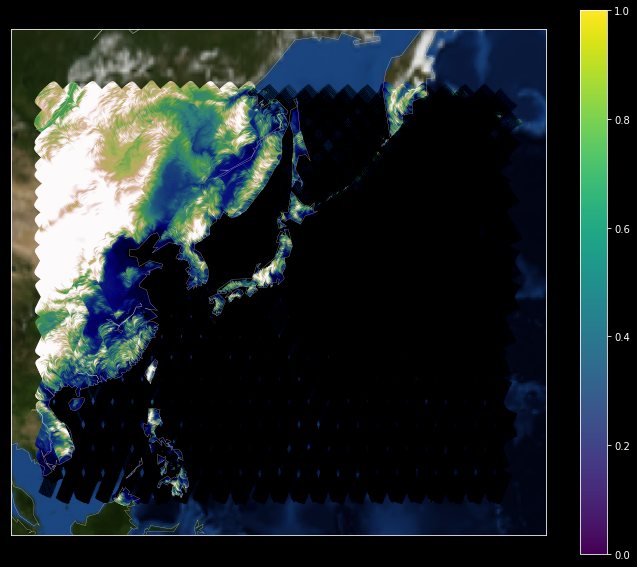

In [0]:
#고도 시각화
#-------------------------------------------------------------------------------
#plotting할 이미지 인덱스 설정
start = 0
end = 1000
#-------------------------------------------------------------------------------
# 배경그리기
plt.figure(figsize = (12,10))
fig = plt.gcf()
m = Basemap(projection='merc', \
            llcrnrlat=0, urcrnrlat=60, \
            llcrnrlon=100, urcrnrlon=180, \
            lat_ts=20, \
            resolution='c')

m.bluemarble(scale=0.2)   # full scale will be overkill
m.drawcoastlines(color='white', linewidth=0.2)  # add coastlines
#-------------------------------------------------------------------------------
#육지 그리기
land_index = (train_dem[start : end,:,:,0].reshape(-1) > 0)
x, y = m(train[start : end,:,:,10].reshape(-1)[land_index], train[start : end,:,:,11].reshape(-1)[land_index])   # transform coordinates
cmap = 'gist_earth'
ax = plt.scatter(x=x, y=y,
                     c=train_dem[start : end,:,:,0].reshape(-1)[land_index], # 색깔은 channel0
                     cmap = cmap,
                     #sizes=(1, 2000),
                     #color = 'red',
                     #size=10,
                     alpha = 0.5,
                     linewidth=0,
                     vmax = 1000,
                     vmin = 0
                     )
#-------------------------------------------------------------------------------
# 바다 그리기
sea_index = (land_idnex != True)
x_sea, y_sea =  m(train[start : end,:,:,10].reshape(-1)[sea_index], train[start : end,:,:,11].reshape(-1)[sea_index])
ax = plt.scatter(x=x_sea, y=y_sea,
                     color='black', # 색깔은 channel0
                     s=0.01,
                     alpha = 1,
                     )
cbar= plt.colorbar()
#-------------------------------------------------------------------------------
plt.show()


## 0번 ~ 8번 채널 시각화
1. 0~1000번 샘플이용
2. 지도 위에그리기
3. 함수화 plot_in_earth
4. 강수량 시각화 함수 만들기(0.1이상 만 plotting)

In [0]:
#함수로 만들기
def plot_in_earth(start = 0, end = 1000, data = train, ch = 0, vmin = 0, vmax = 100, auto = True):
    plt.figure(figsize = (15,10))
    fig = plt.gcf()
    m = Basemap(projection='merc', \
                llcrnrlat=0, urcrnrlat=60, \
                llcrnrlon=100, urcrnrlon=180, \
                lat_ts=20, \
                resolution='c')
    m.bluemarble(scale=0.2)   # full scale will be overkill
    m.drawcoastlines(color='white', linewidth=0.2)  # add coastlines

    x, y = m(data[start : end,:,:,10].reshape(-1), data[start : end,:,:,11].reshape(-1))   # transform coordinates
    cmap = 'coolwarm'
    
    color_value = data[start : end,:,:,ch].reshape(-1)

    if auto == True:
        vmax = np.percentile(color_value, 90)# 90% 이상 지점은 모두 빨간색
        vmin = np.percentile(color_value,10)# 10% 이하 지점은 모두 파란색


    ax = plt.scatter(x=x, y=y,
                        c=color_value, # 색깔은 channel0
                        cmap = cmap,
                        #sizes=(1, 2000),
                        #color = 'red',
                        #size=10,
                        alpha = 0.1,
                        linewidth=0,
                        vmax = vmax,
                        vmin = vmin
                        )
    plt.colorbar()
    if auto == True:
        print(f'90%(color max) = {vmax:2.2f}, 10%(color min) = {vmin:2.2f}')
    else:
        print(f'vmax = {vmax}, vmin = {vmin}')
    print(f'\n< ch{ch}_distribution >')
    for i in range(11):
        print(f'{i * 10}% : {np.percentile(color_value,i * 10):2.2f}')
    plt.show()

90%(color max) = 256.83, 10%(color min) = 161.77

< ch0_distribution >
0% : 155.56
10% : 161.77
20% : 166.26
30% : 169.22
40% : 170.81
50% : 172.03
60% : 173.33
70% : 177.89
80% : 250.20
90% : 256.83
100% : 452.29


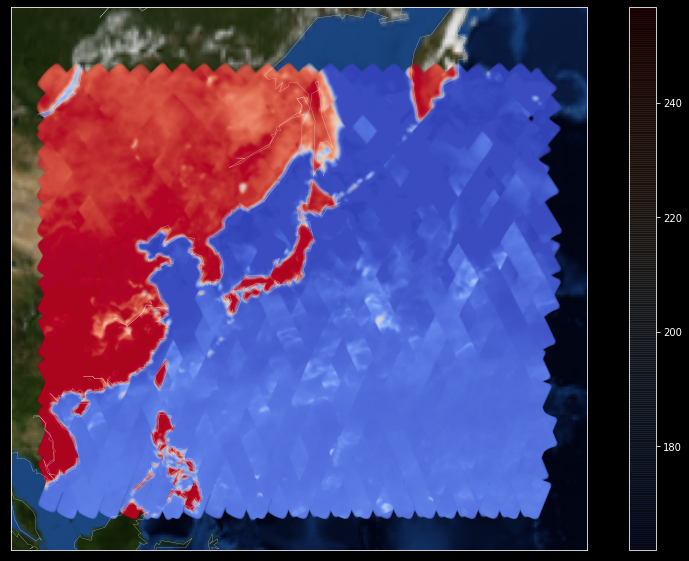

In [0]:
plot_in_earth(ch = 0)

90%(color max) = 248.67, 10%(color min) = 88.11

< ch1_distribution >
0% : 79.28
10% : 88.11
20% : 90.74
30% : 92.65
40% : 94.22
50% : 95.78
60% : 98.07
70% : 107.89
80% : 236.56
90% : 248.67
100% : 1246.59


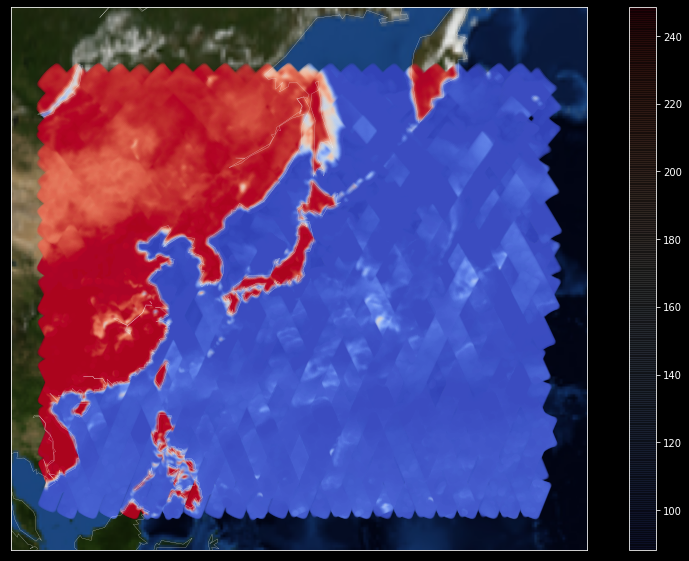

In [0]:
plot_in_earth(ch = 1)

90%(color max) = 256.31, 10%(color min) = 177.01

< ch2_distribution >
0% : 170.23
10% : 177.01
20% : 182.45
30% : 189.03
40% : 193.68
50% : 197.52
60% : 202.10
70% : 210.63
80% : 247.45
90% : 256.31
100% : 311.17


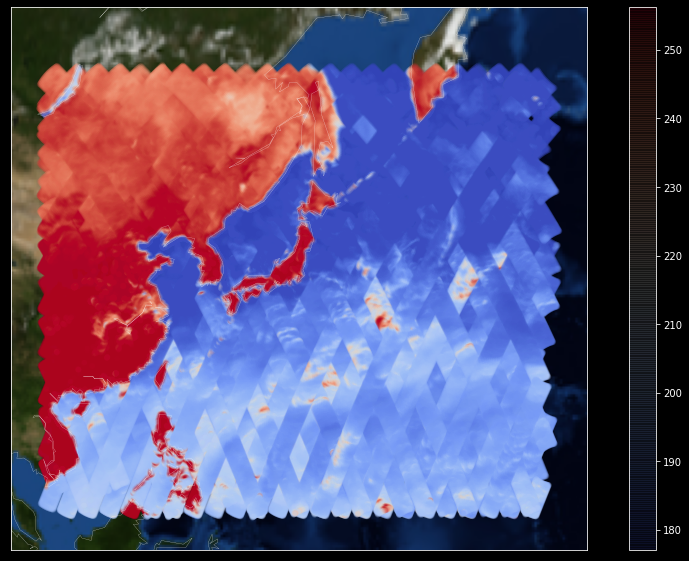

In [0]:
plot_in_earth(ch = 2)

90%(color max) = 247.03, 10%(color min) = 105.37

< ch3_distribution >
0% : 91.69
10% : 105.37
20% : 113.15
30% : 121.00
40% : 127.78
50% : 134.13
60% : 141.82
70% : 157.43
80% : 234.39
90% : 247.03
100% : 332.28


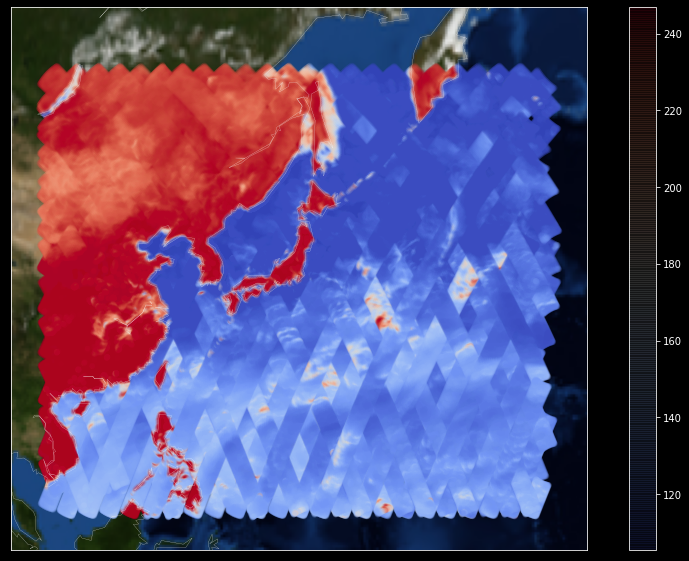

In [0]:
plot_in_earth(ch = 3)

90%(color max) = 257.67, 10%(color min) = 189.39

< ch4_distribution >
0% : 179.55
10% : 189.39
20% : 199.09
30% : 213.60
40% : 222.76
50% : 229.55
60% : 236.10
70% : 242.48
80% : 248.13
90% : 257.67
100% : 304.73


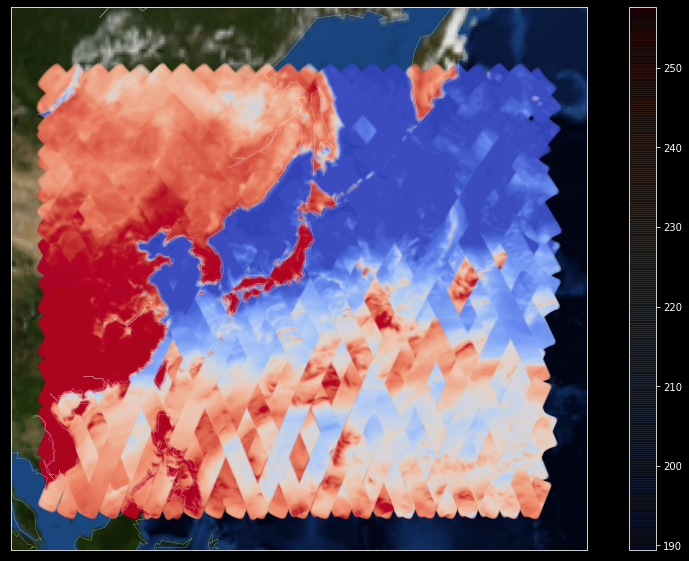

In [0]:
plot_in_earth(ch = 4)

90%(color max) = 256.43, 10%(color min) = 203.69

< ch5_distribution >
0% : 185.28
10% : 203.69
20% : 207.46
30% : 211.94
40% : 215.63
50% : 219.02
60% : 222.99
70% : 228.62
80% : 238.59
90% : 256.43
100% : 303.92


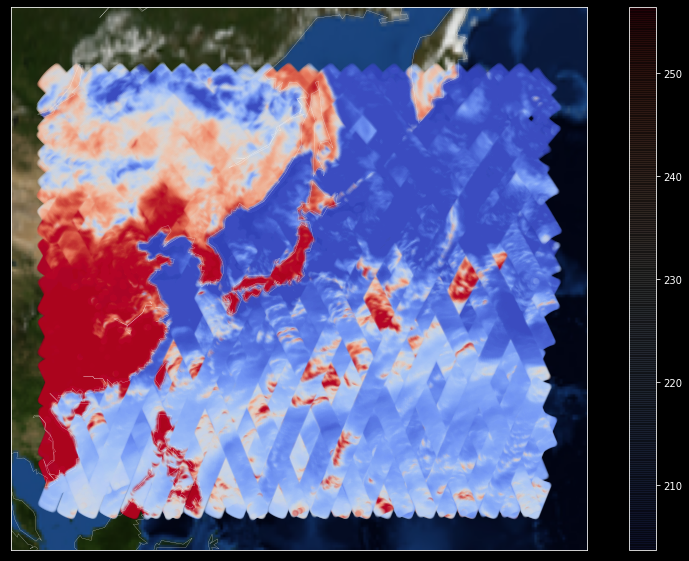

In [0]:
plot_in_earth(ch = 5)

90%(color max) = 246.80, 10%(color min) = 138.06

< ch6_distribution >
0% : 122.76
10% : 138.06
20% : 145.13
30% : 151.19
40% : 157.34
50% : 163.65
60% : 171.92
70% : 195.22
80% : 224.67
90% : 246.80
100% : 325.23


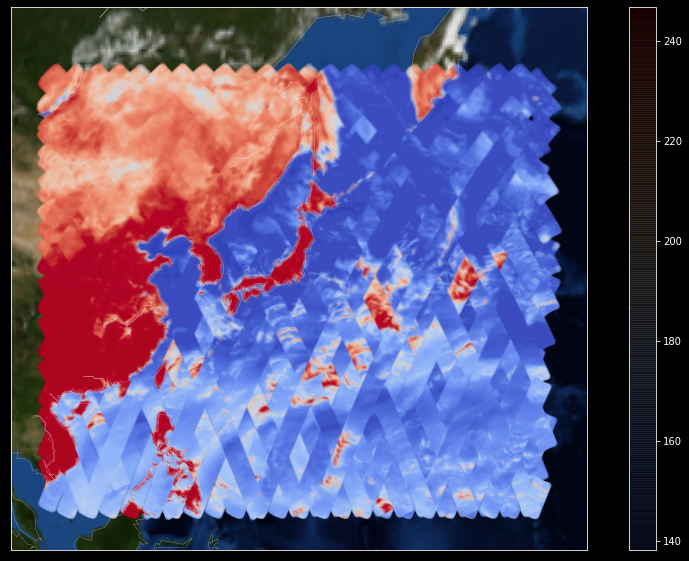

In [0]:
plot_in_earth(ch = 6)

90%(color max) = 277.20, 10%(color min) = 218.37

< ch7_distribution >
0% : 124.56
10% : 218.37
20% : 234.64
30% : 240.26
40% : 249.70
50% : 258.98
60% : 265.26
70% : 269.33
80% : 273.01
90% : 277.20
100% : 300.67


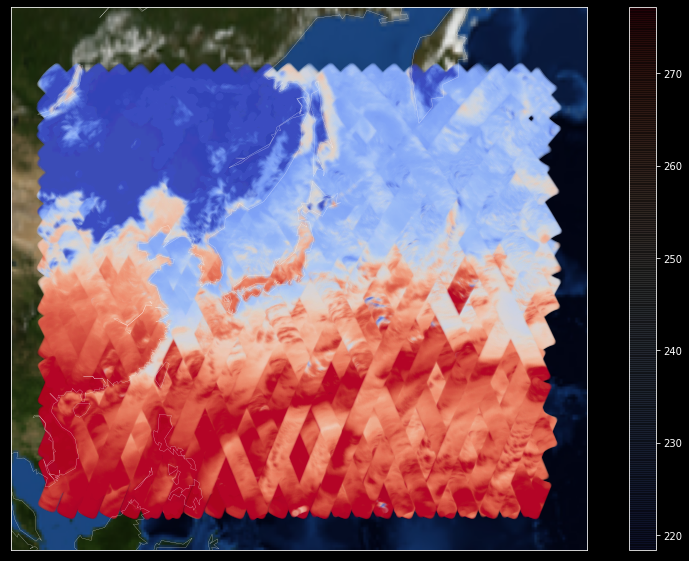

In [0]:
plot_in_earth(ch = 7)

90%(color max) = 267.13, 10%(color min) = 179.91

< ch8_distribution >
0% : 121.81
10% : 179.91
20% : 191.62
30% : 206.58
40% : 220.78
50% : 232.98
60% : 242.29
70% : 250.31
80% : 258.38
90% : 267.13
100% : 328.93


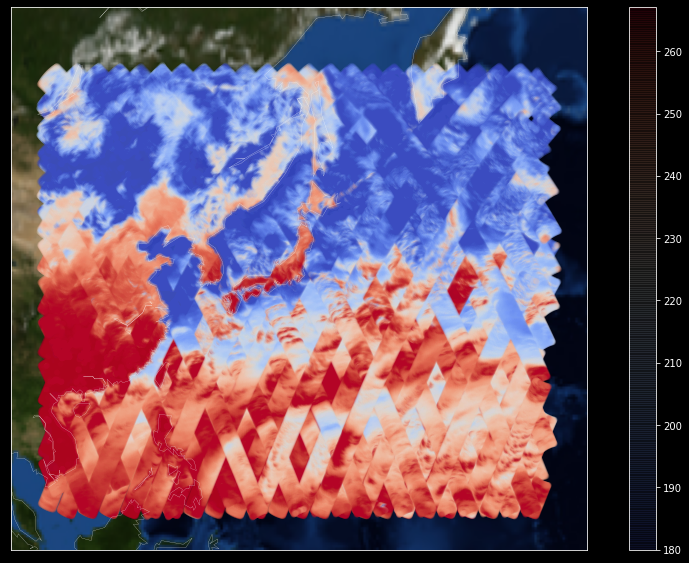

In [0]:
plot_in_earth(ch = 8)

In [0]:
# 강수량 plottin전용 함수 만들기
def plot_precipitation_in_earth(start = 0, end = 1000, data = train, vmin = -0.1, vmax = 3,auto = True):

    plt.figure(figsize = (15,10))
    fig = plt.gcf()
    m = Basemap(projection='merc', \
                llcrnrlat=0, urcrnrlat=60, \
                llcrnrlon=100, urcrnrlon=180, \
                lat_ts=20, \
                resolution='c')
    m.bluemarble(scale=0.2)   # full scale will be overkill
    m.drawcoastlines(color='white', linewidth=0.2)  # add coastlines

    rain_index = (data[start : end,:,:,-1].reshape(-1) > 0.1)

    x, y = m(data[start : end,:,:,10].reshape(-1)[rain_index], data[start : end,:,:,11].reshape(-1)[rain_index])   # transform coordinates
    cmap = 'coolwarm'
    
    color_value = data[start : end,:,:,ch].reshape(-1)[rain_index]

    if auto == True:
        vmax = np.percentile(color_value, 90)# 90% 이상 지점은 모두 빨간색
        vmin = np.percentile(color_value,10)# 10% 이하 지점은 모두 파란색


    ax = plt.scatter(x=x, y=y,
                        c=color_value, # 색깔은 channel0
                        cmap = cmap,
                        #sizes=(1, 2000),
                        #color = 'red',
                        #size=10,
                        alpha = 0.1,
                        linewidth=0,
                        vmax = vmax,
                        vmin = vmin
                        )
    if auto == True:
        print(f'90% = {vmax:2.2f}, 10% = {vmin:2.2f}')
    else:
        print(f'vmax = {vmax}, vmin = {vmin}')

    print('\n< precipitation_distribution >')
    for i in range(11):
        print(f'{i * 10}% : {np.percentile(color_value,i * 10):2.2f}')
    plt.colorbar()
    plt.show()

90% = 3.11, 10% = 0.28

< precipitation_distribution >
0% : 0.10
10% : 0.28
20% : 0.38
30% : 0.48
40% : 0.60
50% : 0.74
60% : 0.94
70% : 1.24
80% : 1.79
90% : 3.11
100% : 299.74


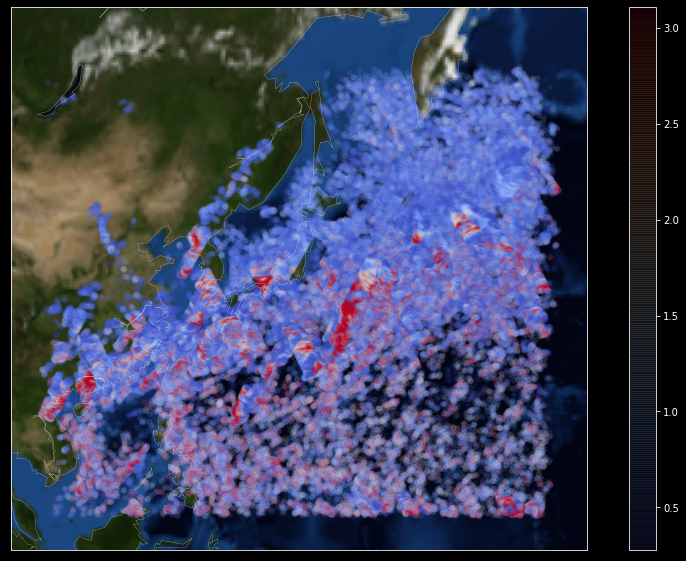

In [0]:
# precipitation > 0.1인 경우에만 plotting
plot_precipitation_in_earth(start = 0, end = 3000,vmin = None, vmax = None, auto = True)

## 이상치 주변 분석

In [0]:
outlier_index = np.array([ 1011,  2536,  5229,  7616,  7787, 10530, 11399, 13175, 13779,
       16551, 21360, 22587, 24630, 27860, 27941, 28050, 29970, 30389,
       30475, 33520, 34534, 34944, 37548, 38213, 39155, 41866, 42806,
       43557, 45841, 46177, 46225, 49185, 51178, 57082, 58656, 60763,
       61366, 63588, 66096, 66375, 67073, 67445, 67861, 71221, 71535,
       71651, 73032, 74976, 75755])

In [0]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
def plot_outlier_in_earth(data = train, index = None ,ch = 0, vmin = None, vmax = None, auto = True):
    plt.figure(figsize = (20,10))
#--------------------------------------------------------------------------------
#전체 지역 중 이상치 이미지 이전 100개의 샘플들 같이 보여주기
    plt.subplot(131)
    m1 = Basemap(projection='merc', \
                llcrnrlat=0, urcrnrlat=60, \
                llcrnrlon=100, urcrnrlon=180, \
                lat_ts=20, \
                resolution='c')
    m1.bluemarble(scale=0.2)   # full scale will be overkill
    m1.drawcoastlines(color='white', linewidth=0.2)  # add coastlines

    before_images = 100
    if index < 100:
        before_images = index

    after_images = 10
    if len(data) - index < 10:
        after_images = len(data) - index
    x, y = m1(data[index - before_images : index + 10,:,:,10].reshape(-1), data[index - before_images : index + 10,:,:,11].reshape(-1))   # transform coordinates
    cmap = 'coolwarm'
    color_value = data[index - before_images : index + 10,:,:,ch].reshape(-1)

    if auto == True:
        vmax = np.percentile(color_value, 90)# 90% 이상 지점은 모두 빨간색
        vmin = np.percentile(color_value,10)# 10% 이하 지점은 모두 파란색

    ax1 = plt.gca()
    im1 = ax1.scatter(x=x, y=y,
                        c=color_value, # 색깔은 channel0
                        cmap = cmap,
                        alpha = 0.1,
                        linewidth=0,
                        vmax = vmax,
                        vmin = vmin
                        )
    # 경계 추가하기
    x_ow, y_ow = m1(data[index,:,0,10], data[index,:,0,11])
    x_uw, y_uw = m1(data[index,:,39,10], data[index,:,39,11])
    x_lh, y_lh = m1(data[index,0,:,10], data[index,0,:,11])
    x_rh, y_rh = m1(data[index,39,:,10], data[index,39,:,11])

    x_bound = np.concatenate([x_ow,x_uw, x_lh, x_rh])
    y_bound = np.concatenate([y_ow,y_uw, y_lh, y_rh])

    ax1.scatter(x=x_bound, y=y_bound,
                        c = 'y',
                        s = 5,
                        linewidth=0)
    
    #color bar size를 조절하기 위해서 약간의 코드 추가
    divider = make_axes_locatable(ax1)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im1, cax=cax)
    ax1.set_title(f'< Nearby samples in ch{ch} >')


#--------------------------------------------------------------------------------
# 이상치 데이터 부분 확대하기
    plt.subplot(132)

    background_xl = data[index,:,:,10].min() - 2
    background_xr = data[index,:,:,10].max() + 2


    background_yu = data[index,:,:,11].min() - 1
    background_yo = data[index,:,:,11].max() + 1



    m2 = Basemap(projection='merc', \
                llcrnrlat= background_yu, urcrnrlat = background_yo, \
                llcrnrlon = background_xl, urcrnrlon = background_xr, \
                lat_ts=20, \
                resolution='c')
    m2.bluemarble(scale=0.2)   # full scale will be overkill
    m2.drawcoastlines(color='white', linewidth=0.2)  # add coastlines
    x_out, y_out = m2(data[index,:,:,10].reshape(-1), data[index,:,:,11].reshape(-1))

    color_values_out = data[index,:,:,ch].reshape(-1)

    ax2 = plt.gca()
    im2 = ax2.scatter(x=x_out, y=y_out,
                        c=color_values_out, # 색깔은 channel0
                        cmap = cmap,
                        s = 100,    
                        alpha = 0.5,
                        linewidth=0,
                        vmax = vmax,
                        vmin = vmin
                        )
    #color bar size를 조절하기 위해서 약간의 코드 추가
    divider = make_axes_locatable(ax2)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im2, cax=cax)
    ax2.set_title(f'< Outlier {index} in ch{ch} >')
#--------------------------------------------------------------------------------
# 이상치 데이터 부분 확대하기
    plt.subplot(133)
    
    m2.bluemarble(scale=0.2)   # full scale will be overkill
    m2.drawcoastlines(color='white', linewidth=0.2)  # add coastlines
    ax3 = plt.gca()
    #--------------------------------
    sunny_index = (data[index,:,:,-1].reshape(-1) <= 0.1)
    
    x_sunny, y_sunny = m2(data[index,:,:,10].reshape(-1)[sunny_index], data[index,:,:,11].reshape(-1)[sunny_index])
    im3 = ax3.scatter(x=x_sunny, y=y_sunny,
                        c='black', # 색깔은 channel0
                        s = 200,    
                        alpha = 0.01,
                        linewidth=0
                        )
    
    #--------------------------------
    rain_index = sunny_index != True
    if rain_index.sum() > 0:
        
        x_rain, y_rain = m2(data[index,:,:,10].reshape(-1)[rain_index], data[index,:,:,11].reshape(-1)[rain_index])   # transform coordinates
        cmap = 'coolwarm'
        color_value_rain = data[index,:,:,ch].reshape(-1)[rain_index]

        if auto == True:
            vmax = np.percentile(color_value_rain, 90)# 90% 이상 지점은 모두 빨간색
            vmin = np.percentile(color_value_rain,10)# 10% 이하 지점은 모두 파란색
        
        im3 = ax3.scatter(x=x_rain, y=y_rain,
                            c=color_value_rain, # 색깔은 channel0
                            cmap = cmap,
                            s = 10,    
                            alpha = 1,
                            linewidth=0,
                            vmax = vmax,
                            vmin = vmin
                            )
        
    #--------------------------------
    #color bar size를 조절하기 위해서 약간의 코드 추가
    divider = make_axes_locatable(ax3)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im3, cax=cax)
    ax3.set_title(f"< Precipitations of {index} sample >")
#--------------------------------------------------------------------------------
    if auto == True:
        print(f'90% = {vmax:2.2f}, 10% = {vmin:2.2f}')
    else:
        print(f'vmax = {vmax}, vmin = {vmin}')
    plt.show()

90% = 247.80, 10% = 237.50


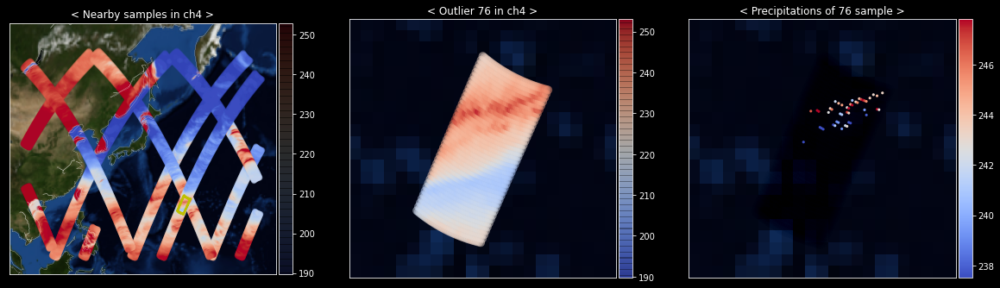

In [0]:
plot_outlier_in_earth(index = 76, ch = 4)

90% = 263.18, 10% = 189.13


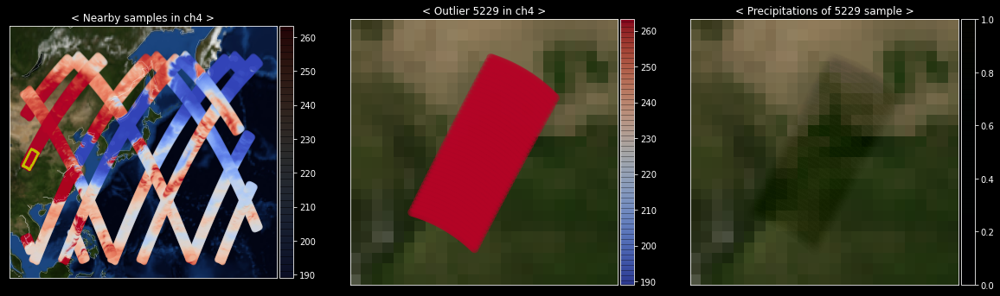

In [0]:
plot_outlier_in_earth(index = outlier_index[2], ch = 4)

90% = 276.86, 10% = 268.93


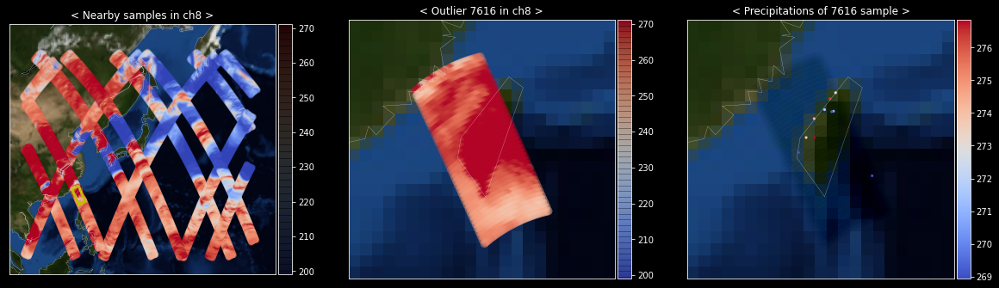

In [0]:
plot_outlier_in_earth(index = outlier_index[3], ch = 8)

## 모델만들기

In [0]:
def build_model(input_layer, start_neurons):
    
    # 40 x 40 -> 20 x 20
    conv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same")(input_layer)
    conv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same")(conv1)
    pool1 = BatchNormalization()(conv1)
    pool1 = MaxPooling2D((2, 2))(pool1)
    pool1 = Dropout(0.25)(pool1)

    # 20 x 20 -> 10 x 10
    conv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same")(pool1)
    conv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same")(conv2)
    pool2 = BatchNormalization()(conv2)
    pool2 = MaxPooling2D((2, 2))(pool2)
    pool2 = Dropout(0.25)(pool2)

    # 10 x 10 
    convm = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same")(pool2)

    # 10 x 10 -> 20 x 20
    deconv2 = Conv2DTranspose(start_neurons * 2, (3, 3), strides=(2, 2), padding="same")(convm)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = Dropout(0.25)(uconv2)
    uconv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same")(uconv2)
    uconv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same")(uconv2)
    uconv2 = BatchNormalization()(uconv2)

    # 20 x 20 -> 40 x 40
    deconv1 = Conv2DTranspose(start_neurons * 1, (3, 3), strides=(2, 2), padding="same")(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = Dropout(0.25)(uconv1)
    uconv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same")(uconv1)
    uconv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same")(uconv1)
    uconv1 = BatchNormalization()(uconv1)
    uconv1 = Dropout(0.25)(uconv1)
    output_layer = Conv2D(1, (1,1), padding="same", activation='relu')(uconv1)
    
    return output_layer

input_layer = Input((40, 40, 11)) ## landtype추가, 월별 데이터 추가
output_layer = build_model(input_layer, 32)

In [0]:
model = Model(input_layer, output_layer)

In [0]:
from sklearn.metrics import f1_score

def mae(y_true, y_pred) :
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    y_true = y_true.reshape(1, -1)[0]
    y_pred = y_pred.reshape(1, -1)[0]
    over_threshold = y_true >= 0.1
    return np.mean(np.abs(y_true[over_threshold] - y_pred[over_threshold]))

def fscore(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    y_true = y_true.reshape(1, -1)[0]
    y_pred = y_pred.reshape(1, -1)[0]
    remove_NAs = y_true >= 0
    y_true = np.where(y_true[remove_NAs] >= 0.1, 1, 0)
    y_pred = np.where(y_pred[remove_NAs] >= 0.1, 1, 0)
    return(f1_score(y_true, y_pred))

def maeOverFscore(y_true, y_pred):
    return mae(y_true, y_pred) / (fscore(y_true, y_pred) + 1e-07)

def fscore_keras(y_true, y_pred):
    score = tf.py_function(func=fscore, inp=[y_true, y_pred], Tout=tf.float32, name='fscore_keras')
    return score

def maeOverFscore_keras(y_true, y_pred):
    score = tf.py_function(func=maeOverFscore, inp=[y_true, y_pred], Tout=tf.float32,  name='custom_mse') 
    return score

In [0]:
model.compile(loss="mae", optimizer="adam", metrics=[maeOverFscore_keras, fscore_keras])

## 데이터 제네레이터 만들기

In [0]:
train_month = train_orbit.month.values

In [0]:
gc.collect()
from sklearn.model_selection import KFold
kf = KFold(n_splits=5)
model_history = []
fold_number = 0

for train_index, test_index in kf.split(train):
    print(f'\nFold {fold_number}')
    fold_number = fold_number + 1
    
#-----------------------------------------------------------------------------
    def trainGenerator():
        for index, file in enumerate(train[train_index]):
            target= file[:,:,-1].reshape(40,40,1)
            cutoff_labels = np.where(target < 0, 0, target)
            if (cutoff_labels > 0).sum() < 50:
                continue
            feature = np.zeros((40,40,11))
            feature[:,:,:10] = file[:,:,:10]#########################land type, month 추가
            feature[:,:,-1] = train_month[train_index][index]############### month 추가

            yield (feature, cutoff_labels)
    train_dataset = tf.data.Dataset.from_generator(trainGenerator,
                                                (tf.float32, tf.float32),
                                                (tf.TensorShape([40,40,11]),########################land type 추가, month 추가
                                                    tf.TensorShape([40,40,1])))
    train_dataset = train_dataset.batch(512).prefetch(1)
#-----------------------------------------------------------------------------
    def testGenerator():
        for index, file in enumerate(train[test_index]):
            target= file[:,:,-1].reshape(40,40,1)
            cutoff_labels = np.where(target < 0, 0, target)
            feature = np.zeros((40,40,11))
            feature[:,:,:10] = file[:,:,:10]#########################land type, month 추가
            feature[:,:,-1] = train_month[test_index][index]############### month 추가
            if (cutoff_labels > 0).sum() < 50:
                continue
            yield (feature, cutoff_labels)

    test_dataset = tf.data.Dataset.from_generator(testGenerator,
                                                (tf.float32, tf.float32),
                                                (tf.TensorShape([40,40,11]),########################land type 추가, month 추가
                                                    tf.TensorShape([40,40,1])))
    test_size = len(test_index)
    test_dataset = test_dataset.batch(test_size).prefetch(1)
#-----------------------------------------------------------------------------

    
    
    history = model.fit(train_dataset, epochs = 10, verbose=1, validation_data = test_dataset)

    #history = model.fit(train_dataset, epochs = 5, ,batch_size = 11, verbose=1)
    model_history.append(history)
    #del data
    del train_dataset
    del test_dataset
    gc.collect()


Fold 0
Epoch 1/10
49/49 [==============================] - 44s 901ms/step - loss: 0.4182 - maeOverFscore_keras: 4.9837 - fscore_keras: 0.4193 - val_loss: 0.5660 - val_maeOverFscore_keras: 5.8921 - val_fscore_keras: 0.3291
Epoch 2/10
49/49 [==============================] - 41s 834ms/step - loss: 0.2936 - maeOverFscore_keras: 3.3614 - fscore_keras: 0.5416 - val_loss: 0.2916 - val_maeOverFscore_keras: 2.9192 - val_fscore_keras: 0.6059
Epoch 3/10
49/49 [==============================] - 41s 832ms/step - loss: 0.2853 - maeOverFscore_keras: 3.1318 - fscore_keras: 0.5648 - val_loss: 0.2828 - val_maeOverFscore_keras: 2.8595 - val_fscore_keras: 0.6066
Epoch 4/10
49/49 [==============================] - 41s 833ms/step - loss: 0.2780 - maeOverFscore_keras: 2.8961 - fscore_keras: 0.5940 - val_loss: 0.3017 - val_maeOverFscore_keras: 4.1025 - val_fscore_keras: 0.4638
Epoch 5/10
49/49 [==============================] - 41s 832ms/step - loss: 0.2705 - maeOverFscore_keras: 2.6802 - fscore_keras: 0.62

In [0]:
## 모델 저장하기
model.save('model_landtype_month.h5')
!cp model_landtype_month.h5 '/content/drive/My Drive/2020 Kaggle Study/model'

In [0]:
def plot_acc(his, epoch, title):
    plt.style.use('ggplot')
    plt.figure()
    plt.plot(np.arange(0, epoch), his.history['maeOverFscore_keras'], label='maeOverFscore_keras')
    plt.plot(np.arange(0, epoch), his.history['val_maeOverFscore_keras'], label='val_maeOverFscore_keras')
    plt.title(title)
    plt.xlabel(f'Epoch {epoch}')
    plt.ylabel('Accuracy')
    plt.legend(loc='upper right')
    plt.show()

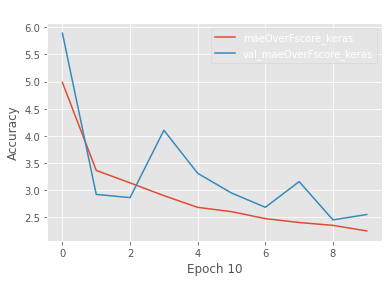

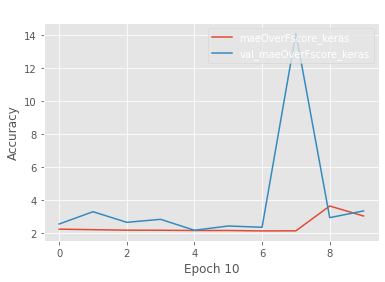

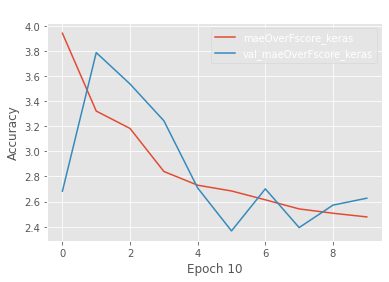

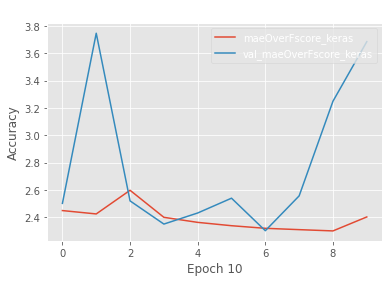

In [0]:
for dataset in range(4):
    #plot_loss(model_history[dataset], 10 , f'Training Dataset: {dataset}')
    plot_acc(model_history[dataset], 10 , f'Training Dataset: {dataset}')


## submission 만들기

In [0]:
# 훈련에서 사용하는 0~8번 채널, ladtype 만을 뽑아서 X_test에 저장하기
test_submit = np.load('/content/drive/My Drive/2020 Kaggle Study/data/test.npy')
test_submit = test_submit[:,:,:,:10]
del test_submit
gc.collect()
pred = model.predict(test_submit)

## submission 만들기

In [0]:
submission = pd.read_csv('/content/drive/My Drive/2020 Kaggle Study/data/sample_submission.csv')

In [0]:
submission.iloc[:,1:] = pred.reshape(-1, 1600)

In [0]:
submission.to_csv('Dacon_landtype.csv', index = False)

In [0]:
# 제출파일 구글 드라이브에 올리기
!cp Dacon_landtype.csv '/content/drive/My Drive/2020 Kaggle Study/submission'

90% = 198.43, 10% = 188.97


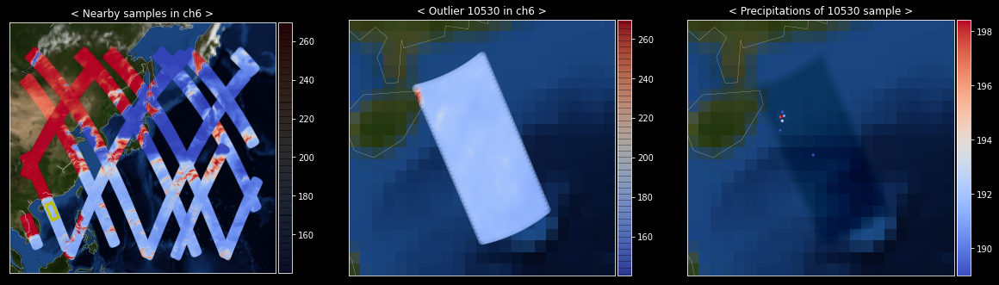

In [0]:
plot_outlier_in_earth(index = outlier_index[5], ch = 6)

90% = 259.24, 10% = 216.81


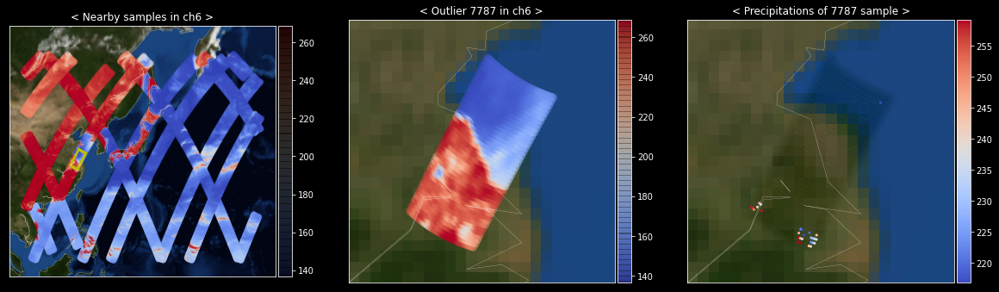

In [0]:
plot_outlier_in_earth(index = outlier_index[4], ch = 6)